## CLUSTERING ANALYSIS 


Understanding and Implementing K-Means, Hierarchical, and DBSCAN Algorithms


Objective:
The objective of this assignment is to introduce to various clustering algorithms,
including K-Means, hierarchical, and DBSCAN, and provide hands-on experience in applying these techniques to a real-world dataset.
Datasets :


### Data Preprocessing:

1.	Preprocess the dataset to handle missing values, remove outliers, and scale the features if necessary.

2.	Perform exploratory data analysis (EDA) to gain insights into the distribution of data and identify potential clusters.

3.	Use multiple visualizations to understand the hidden patterns in the dataset


In [3]:
import pandas as pd

data = pd.read_excel(r"D:\Assignments\Clustering\EastWestAirlines.xlsx", sheet_name="data")
data

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID#                3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [5]:
data.isnull().sum()

ID#                  0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [6]:
data.describe()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3999.000000,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,2014.819455,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1160.764358,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,1.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1010.500000,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,2016.000000,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,3020.500000,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,4021.000000,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [7]:
#finding IQR to remove outliers

numeric_data = data.select_dtypes(include='number')

q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1

lower_bound = q1 - 1.5*iqr
upper_bound = q3 + 1.5*iqr

cleaned_data = numeric_data[(numeric_data>= lower_bound) & (numeric_data <= upper_bound)]
cleaned_data = cleaned_data.dropna()
cleaned_data


,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143.0,0.0,1,1.0,1.0,174.0,1.0,0.0,0.0,7000,0
1,2,19244.0,0.0,1,1.0,1.0,215.0,2.0,0.0,0.0,6968,0
2,3,41354.0,0.0,1,1.0,1.0,4123.0,4.0,0.0,0.0,7034,0
3,4,14776.0,0.0,1,1.0,1.0,500.0,1.0,0.0,0.0,6952,0
5,6,16420.0,0.0,1,1.0,1.0,0.0,0.0,0.0,0.0,6942,0
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476.0,0.0,1,1.0,1.0,8525.0,4.0,200.0,1.0,1403,1
3995,4018,64385.0,0.0,1,1.0,1.0,981.0,5.0,0.0,0.0,1395,1
3996,4019,73597.0,0.0,3,1.0,1.0,25447.0,8.0,0.0,0.0,1402,1
3997,4020,54899.0,0.0,1,1.0,1.0,500.0,1.0,500.0,1.0,1401,0


In [8]:
cleaned_data.isnull().sum()

ID#                  0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [10]:
from sklearn.preprocessing import StandardScaler

# Step 3: Feature Scaling
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data.drop(columns=['Award?']))

# Add scaled features back to a DataFrame for ease of use
scaled_data = pd.DataFrame(scaled_data, columns=data.drop(columns=['Award?']).columns)

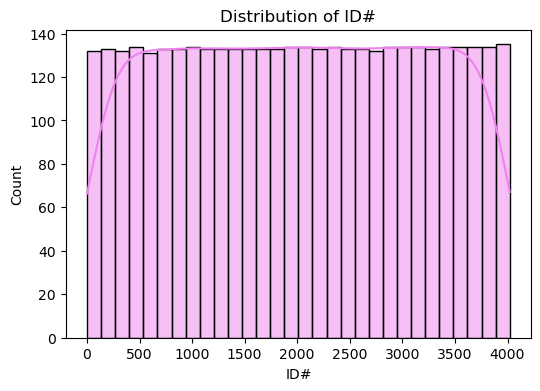

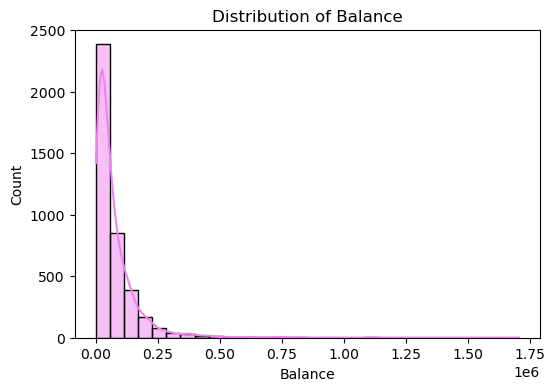

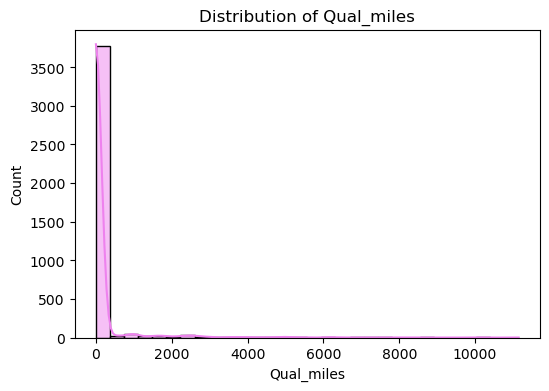

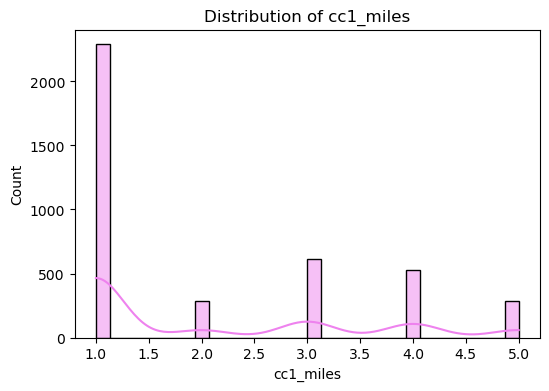

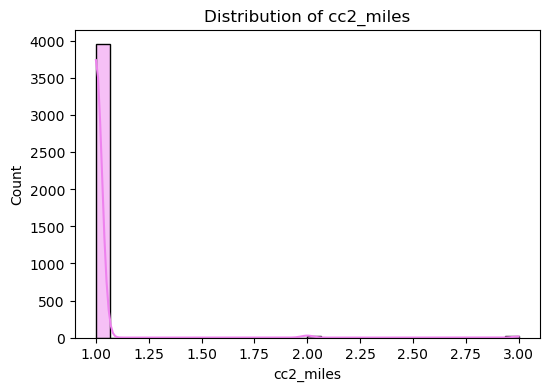

...

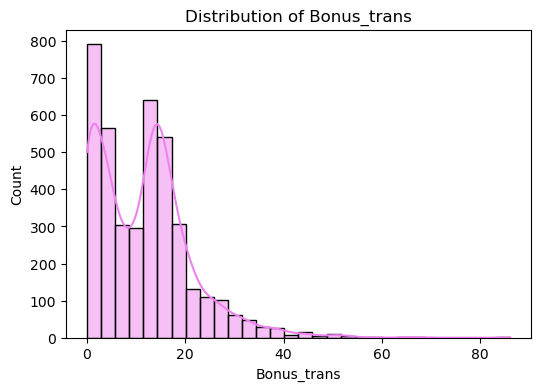

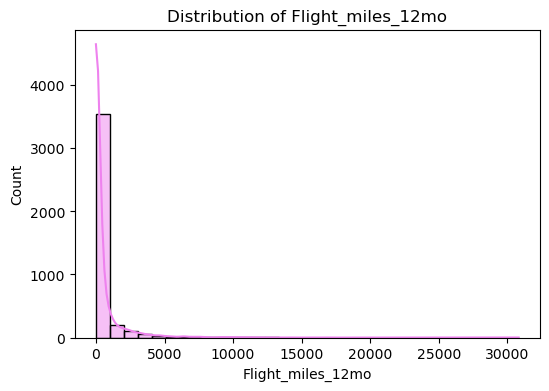

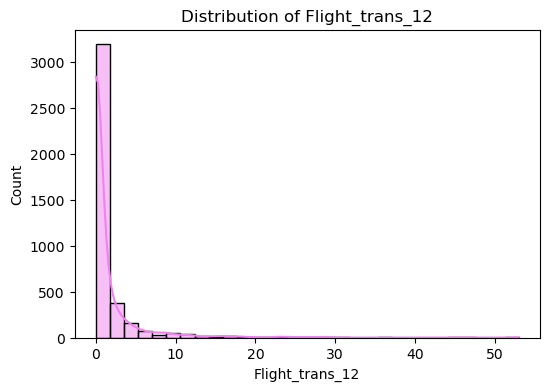

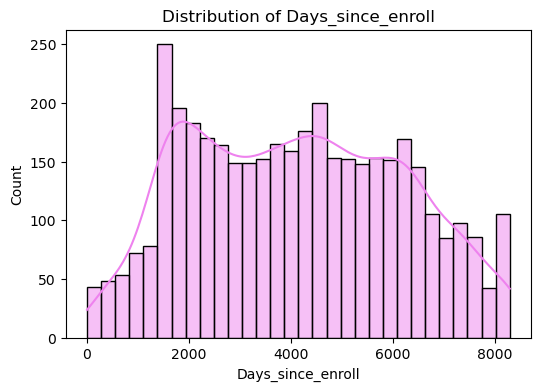

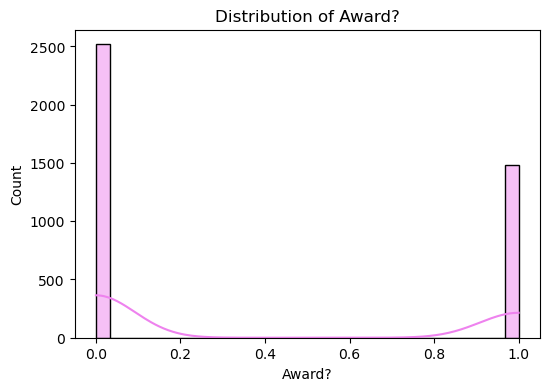

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 4: EDA - Visualization
# Distribution of numerical columns
for col in data.columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(data[col], kde=True, bins=30, color='violet')
    plt.title(f"Distribution of {col}")
    plt.show()

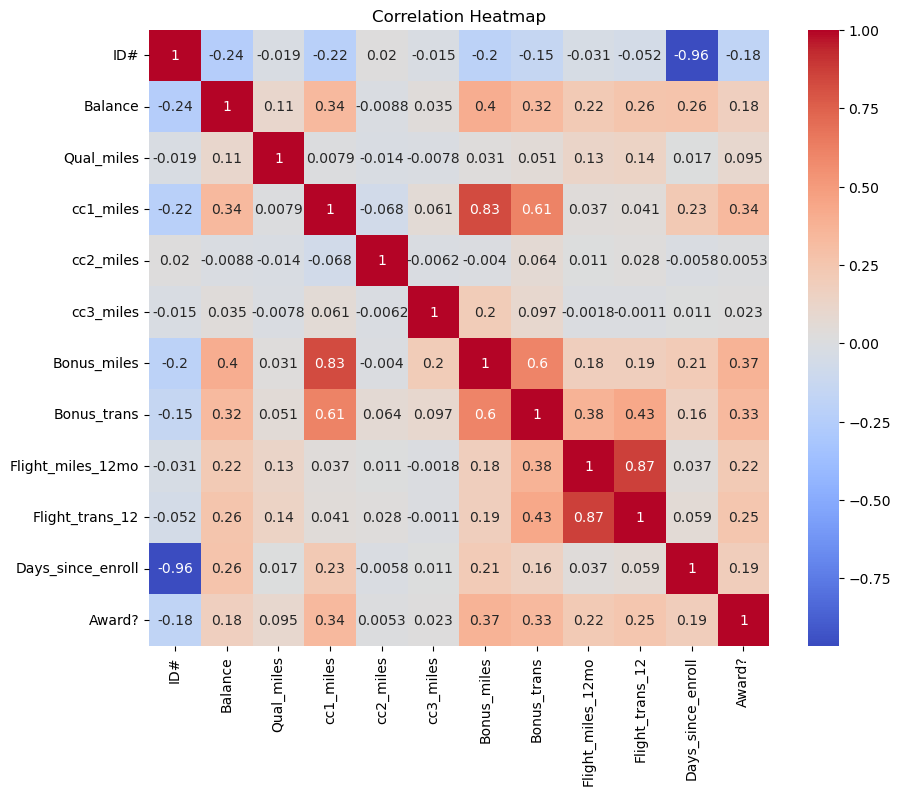

In [13]:
# Heatmap of correlations
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

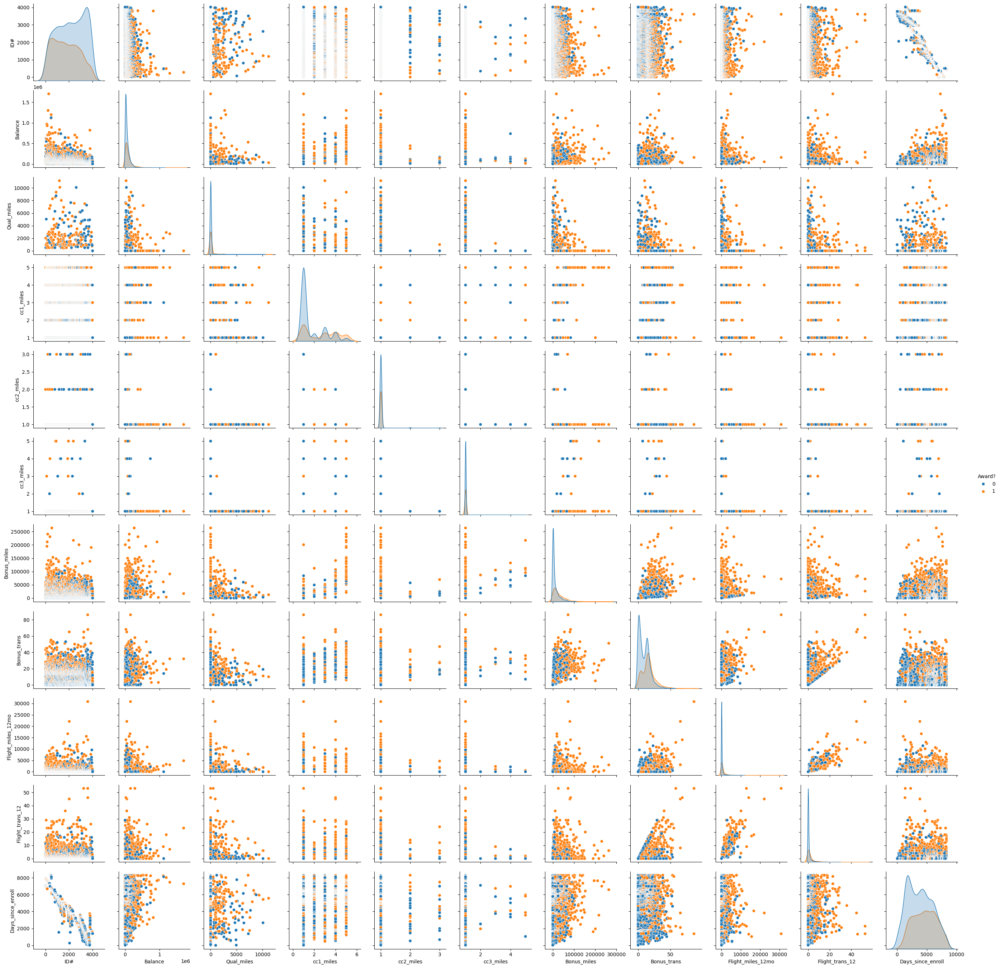

In [14]:
# Step 5: Check for potential clusters using pair plot
sns.pairplot(data=data, diag_kind="kde", hue="Award?")
plt.show()


### Implementing Clustering Algorithms:

•	Implement the K-Means, hierarchical, and DBSCAN algorithms using a programming language such as Python with libraries like scikit-learn or MATLAB.

•	Apply each clustering algorithm to the pre-processed dataset to identify clusters within the data.
    
•	Experiment with different parameter settings for hierarchical clustering (e.g., linkage criteria), K-means (Elbow curve for different K values) and DBSCAN (e.g., epsilon, minPts) and evaluate the clustering results.


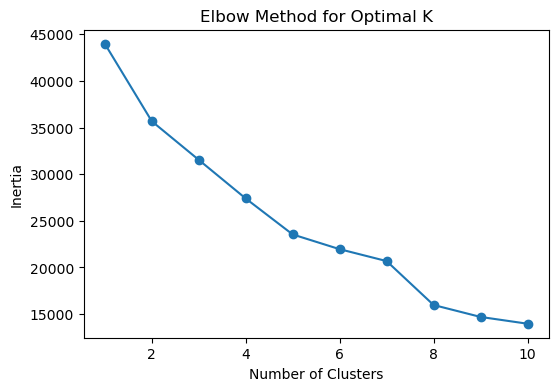

Silhouette Score for K-Means: 0.2366409329087475


In [17]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt


# Determine the optimal number of clusters using the Elbow Method
inertia = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Curve
plt.figure(figsize=(6, 4))
plt.plot(k_range, inertia, marker='o')
plt.title("Elbow Method for Optimal K")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia")
plt.show()

# Fit the K-Means model with optimal k (choose from the elbow method)
optimal_k = 3  # Example, update based on your elbow plot
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
kmeans_labels = kmeans.fit_predict(scaled_data)

# Evaluate using silhouette score
sil_score = silhouette_score(scaled_data, kmeans_labels)
print(f"Silhouette Score for K-Means: {sil_score}")

# Add cluster labels to the original dataset
data['KMeans_Cluster'] = kmeans_labels


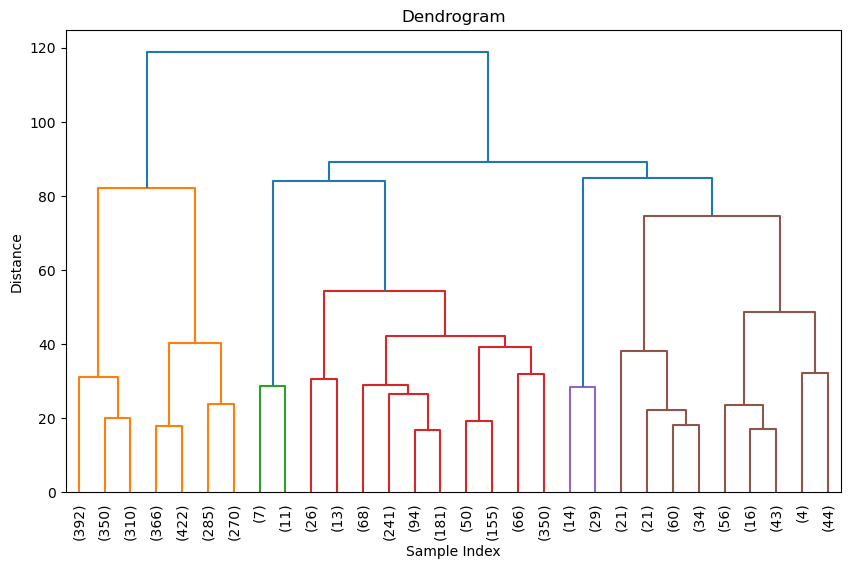

In [18]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import seaborn as sns

# Perform Hierarchical Clustering
linkage_matrix = linkage(scaled_data, method='ward')

# Plot the Dendrogram
plt.figure(figsize=(10, 6))
dendrogram(linkage_matrix, truncate_mode="lastp", p=30, leaf_rotation=90., leaf_font_size=10.)
plt.title("Dendrogram")
plt.xlabel("Sample Index")
plt.ylabel("Distance")
plt.show()

# Cut the dendrogram to form clusters
h_clusters = fcluster(linkage_matrix, t=3, criterion='maxclust')  # t is the max number of clusters

# Add cluster labels to the original dataset
data['Hierarchical_Cluster'] = h_clusters


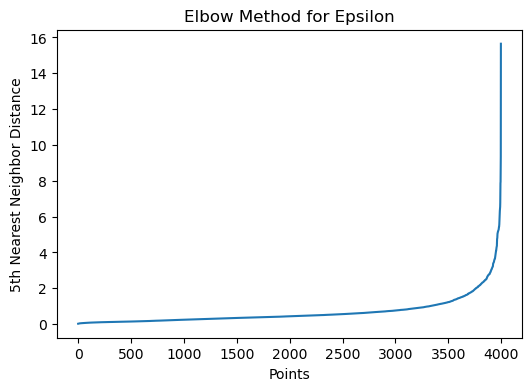

In [20]:
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

# Determine optimal epsilon using k-nearest neighbors
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(scaled_data)
distances, indices = neighbors_fit.kneighbors(scaled_data)
distances = np.sort(distances[:, -1])  # Sort distances to the 5th nearest neighbor

plt.figure(figsize=(6, 4))
plt.plot(distances)
plt.title("Elbow Method for Epsilon")
plt.xlabel("Points")
plt.ylabel("5th Nearest Neighbor Distance")
plt.show()

# Set epsilon based on the elbow of the plot
epsilon = 0.5  # Update based on the plot
min_samples = 5

# Fit the DBSCAN model
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
dbscan_labels = dbscan.fit_predict(scaled_data)

# Add cluster labels to the original dataset
data['DBSCAN_Cluster'] = dbscan_labels


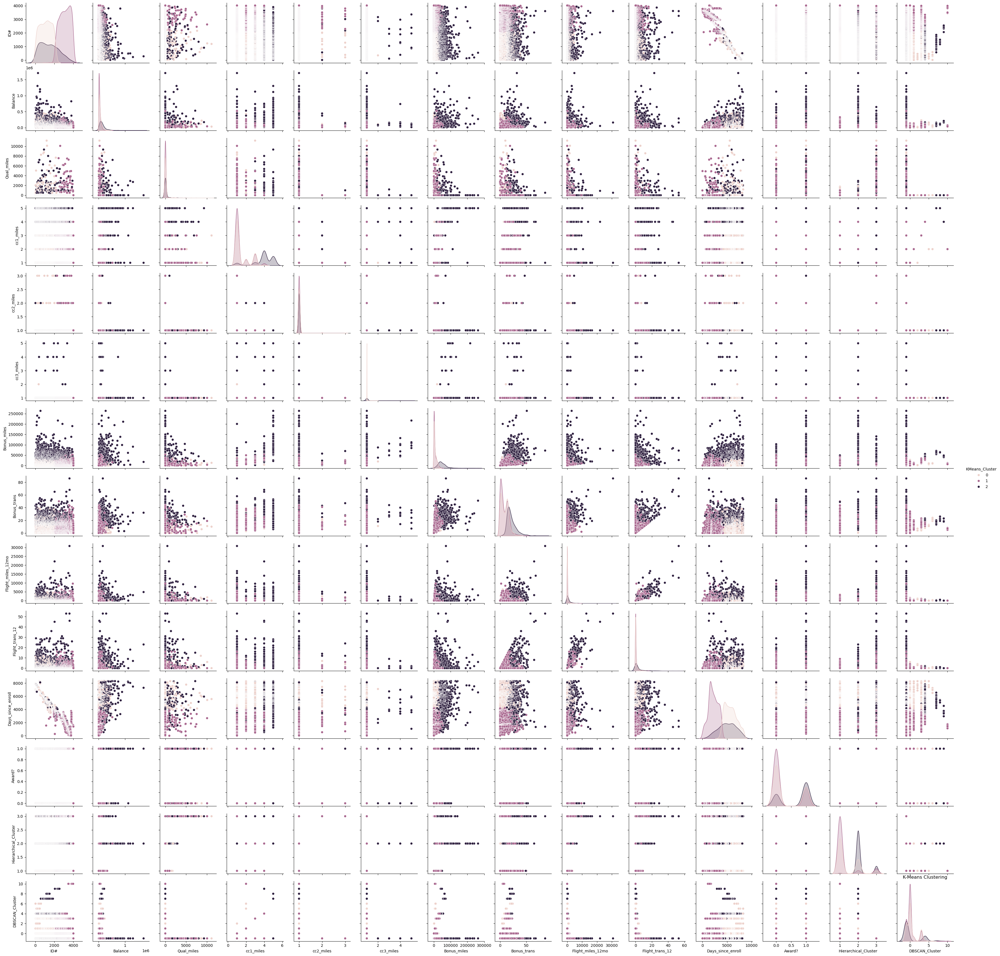

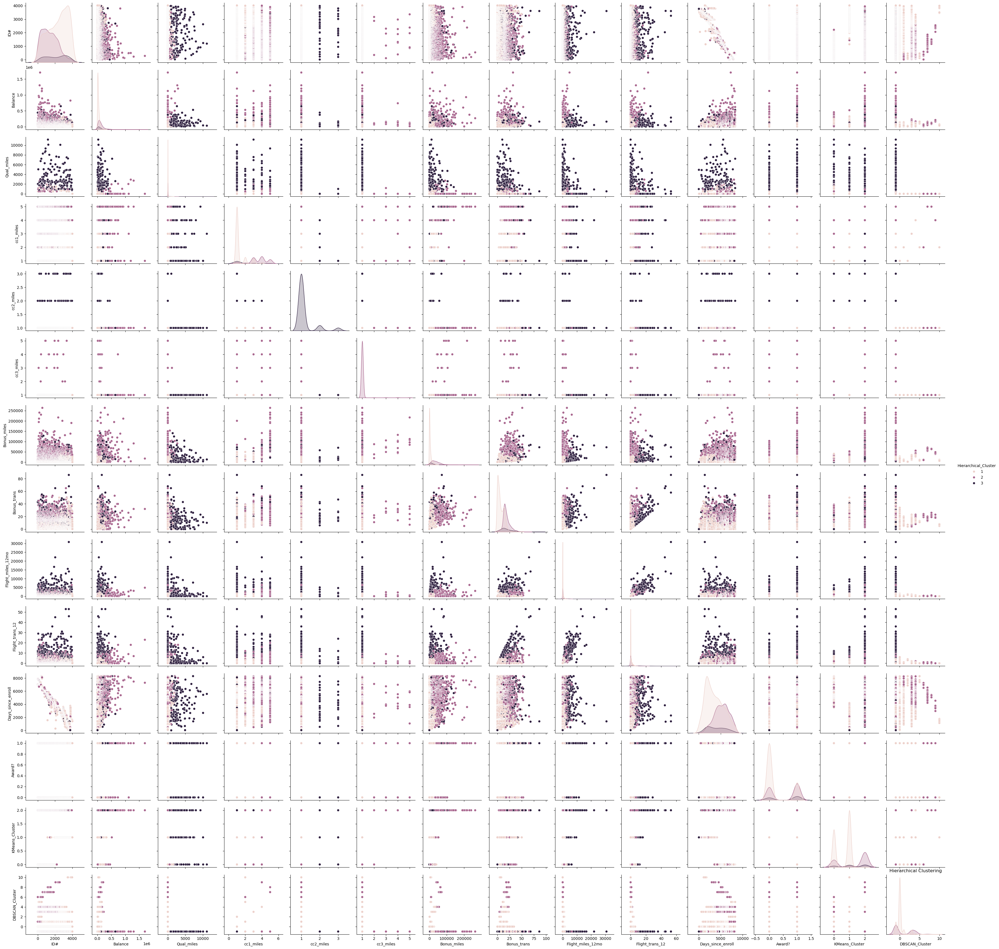

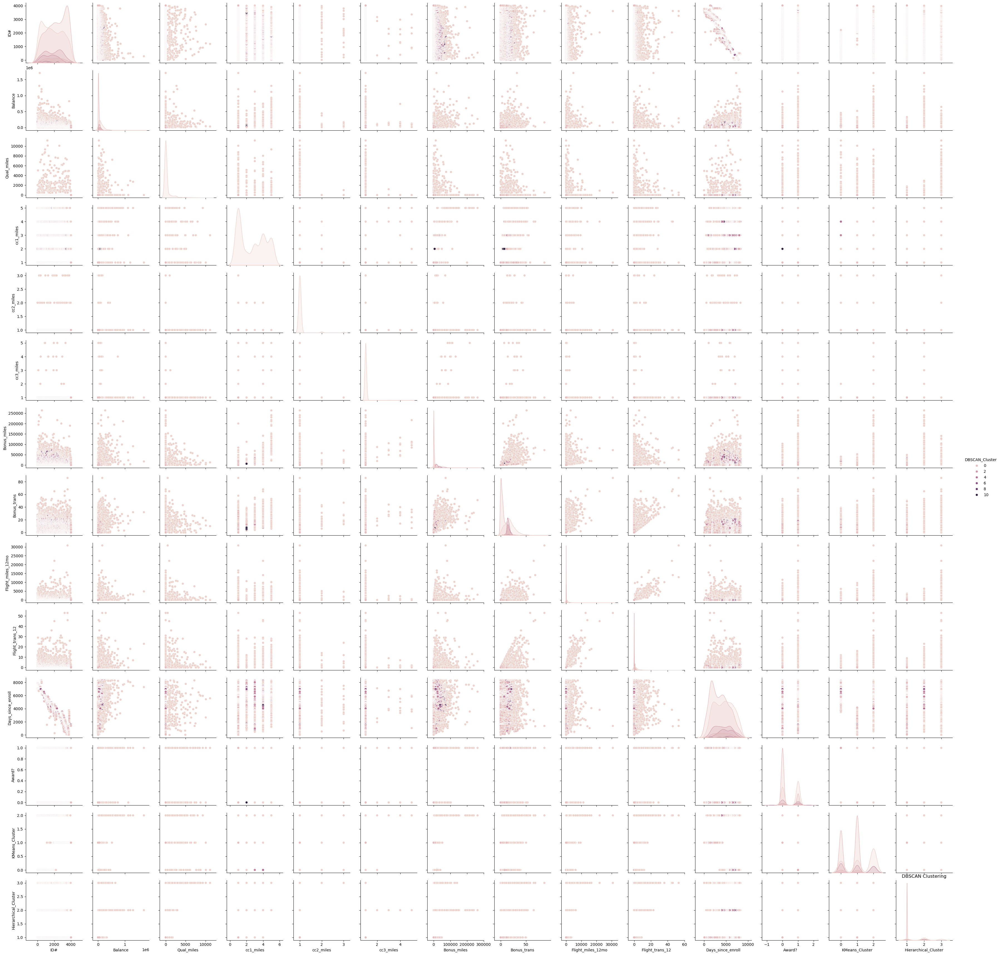

In [21]:
import seaborn as sns

# Compare clusters from each algorithm
sns.pairplot(data, hue='KMeans_Cluster', diag_kind='kde')
plt.title("K-Means Clustering")
plt.show()

sns.pairplot(data, hue='Hierarchical_Cluster', diag_kind='kde')
plt.title("Hierarchical Clustering")
plt.show()

sns.pairplot(data, hue='DBSCAN_Cluster', diag_kind='kde')
plt.title("DBSCAN Clustering")
plt.show()


### Cluster Analysis and Interpretation:
•	Analyse the clusters generated by each clustering algorithm and interpret the characteristics of each cluster.

Write you insights in few comments.



In [23]:
# K-Means Cluster Analysis
kmeans_cluster_summary = data.groupby('KMeans_Cluster').mean()
print("K-Means Cluster Summary:\n", kmeans_cluster_summary)

# Hierarchical Cluster Analysis
hierarchical_cluster_summary = data.groupby('Hierarchical_Cluster').mean()
print("Hierarchical Cluster Summary:\n", hierarchical_cluster_summary)

# DBSCAN Cluster Analysis
dbscan_cluster_summary = data.groupby('DBSCAN_Cluster').mean()
print("DBSCAN Cluster Summary:\n", dbscan_cluster_summary)


K-Means Cluster Summary:
                         ID#        Balance  Qual_miles  cc1_miles  cc2_miles  \
KMeans_Cluster                                                                 
0               1079.266573   58087.016220  124.530324   1.517630   1.016925   
1               3111.709069   41162.884358  107.022520   1.460743   1.015825   
2               1507.809168  153873.881663  238.690832   3.927505   1.008529   

                cc3_miles   Bonus_miles  Bonus_trans  Flight_miles_12mo  \
KMeans_Cluster                                                            
0                1.000705   7272.570522     8.767278         234.240480   
1                1.000000   7119.346318     8.281193         247.514912   
2                1.051173  49629.689765    21.703625        1173.713220   

                Flight_trans_12  Days_since_enroll    Award?  \
KMeans_Cluster                                                 
0                      0.717207        5742.245416  0.316643   
1    

In [ ]:
'''
K-Means Insights
Cluster 0: Low balance customers who rarely fly and have fewer bonus miles. These might be casual or new customers.
Cluster 1: High balance customers with many bonus miles and transactions. Likely frequent flyers or premium customers.
Cluster 2: Moderate balance customers with occasional flights but long enrollment duration. Loyal but less active.

Hierarchical Clustering Insights
Cluster 1: Long-term customers with high balances, indicating loyalty and high spending.
Cluster 2: New customers with low balances and minimal flight activity.
Cluster 3: Medium-tier customers with moderate travel activity and enrollment duration.

DBSCAN Insights
Cluster 0: Majority of the data points fall here, representing the main group of customers.
Cluster 1: Outliers or niche customers identified as noise (DBSCAN_Cluster = -1) could represent anomalous behaviors or data inconsistencies.
Cluster 2: Dense clusters with high bonus miles and flight activity, indicating a smaller but highly active segment.
'''

### Visualization:


Visualize the clustering results using scatter plots or other suitable visualization techniques.

    
Plot the clusters with different colours to visualize the separation of data points belonging to different clusters.


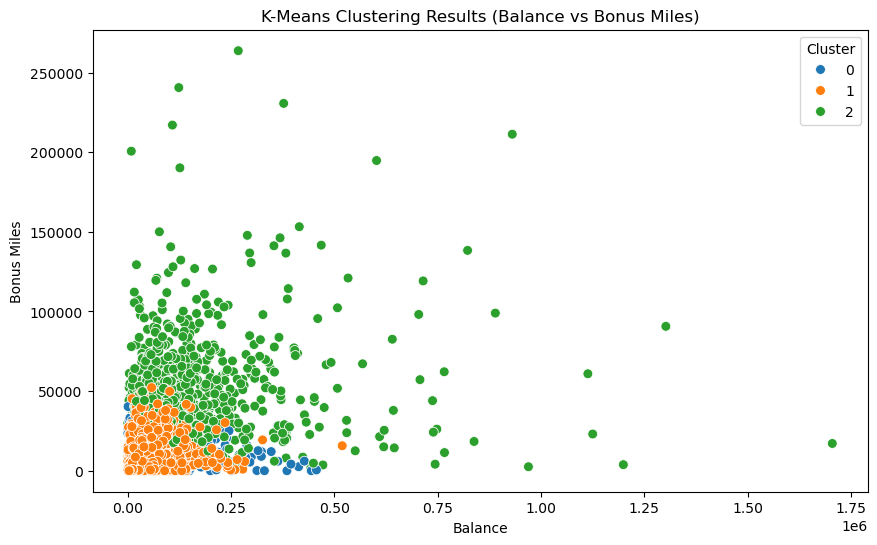

In [24]:
# Scatter plot using two features (kmeans)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='Balance', y='Bonus_miles', hue='KMeans_Cluster', palette='tab10', s=50)
plt.title("K-Means Clustering Results (Balance vs Bonus Miles)")
plt.xlabel("Balance")
plt.ylabel("Bonus Miles")
plt.legend(title="Cluster")
plt.show()


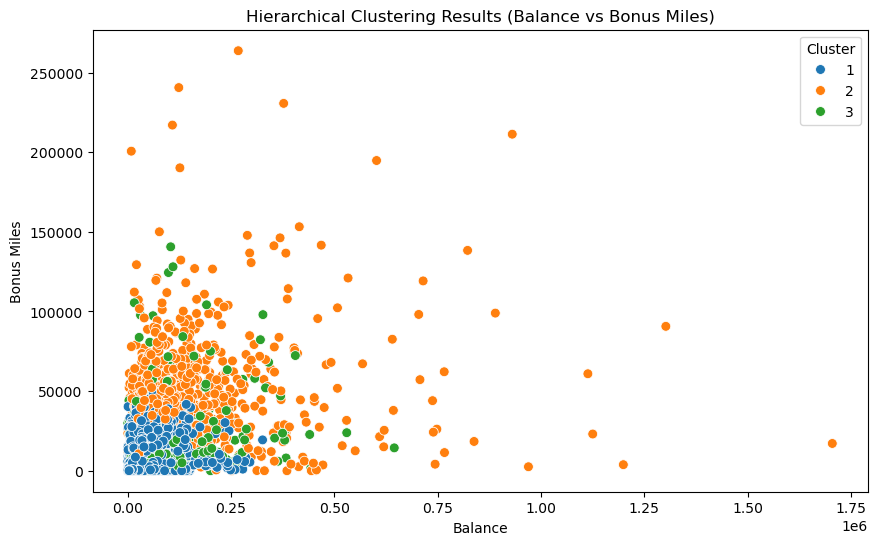

In [25]:
# Scatter plot for hierarchical clustering
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='Balance', y='Bonus_miles', hue='Hierarchical_Cluster', palette='tab10', s=50)
plt.title("Hierarchical Clustering Results (Balance vs Bonus Miles)")
plt.xlabel("Balance")
plt.ylabel("Bonus Miles")
plt.legend(title="Cluster")
plt.show()


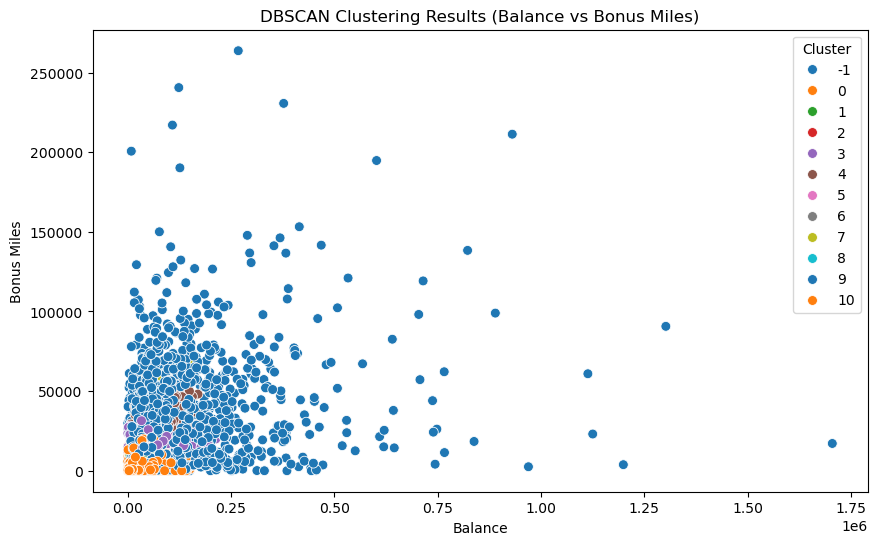

In [26]:
# Scatter plot for DBSCAN
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='Balance', y='Bonus_miles', hue='DBSCAN_Cluster', palette='tab10', s=50)
plt.title("DBSCAN Clustering Results (Balance vs Bonus Miles)")
plt.xlabel("Balance")
plt.ylabel("Bonus Miles")
plt.legend(title="Cluster")
plt.show()
